# **Project: House Prices - Linear Regression Techniques**

### **Reference**: [Kaggle](https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques)

--- 
### **1. Look the big picture**

- **Objective**: Predict house prices by building a robust linear regression model.
- **Goal**: Minimize the Root-Mean-Squared-Error (RMSE) to improve prediction accuracy.
- **Dataset**: 
  - The dataset contains various features about houses (e.g., square footage, number of rooms, etc.) and their sale prices.
  - Provided by the Kaggle competition: *"House Prices - Advanced Regression Techniques."*
- **Evaluation Metric**: Root-Mean-Squared-Error (RMSE).
  

---
### **2. Get the data**

In [1]:
from sklearn.model_selection import StratifiedShuffleSplit
import pandas as pd


def split_train_test(df):
    # Create a price category column
    df["SalePriceCategory"] = pd.qcut(df["SalePrice"], q=5, labels=False)

    # Stratified sampling
    strat_split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
    for train_idx, test_idx in strat_split.split(df, df["SalePriceCategory"]):
        strat_train_set = df.loc[train_idx].drop(columns=["SalePriceCategory"])
        strat_test_set = df.loc[test_idx].drop(columns=["SalePriceCategory"])
    
    return strat_train_set, strat_test_set

In [2]:

df = pd.read_csv("../data/house_price_project/train.csv")

df, df_test = split_train_test(df)

In [3]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
307,308,50,RM,NaN,7920,Pave,Grvl,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,3,2008,WD,Normal,89500
1341,1342,20,RL,66.0,13695,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2008,WD,Normal,155000
1175,1176,50,RL,85.0,10678,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2007,WD,Normal,285000
349,350,60,RL,56.0,20431,Pave,NaN,IR2,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2006,New,Partial,437154
621,622,60,RL,90.0,10800,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,Normal,240000


In [4]:
df.shape

(1168, 81)

---
### **3. Explore and visualize the data to gain insights.**

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as stats

#### Find null values

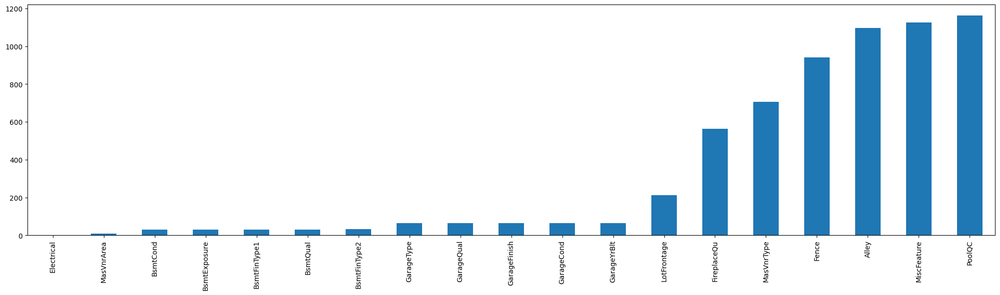

In [6]:
missing = df.isnull().sum()
missing = missing[missing > 0]
missing.sort_values(inplace=True)
missing.plot(kind='bar', figsize=(25, 6));


#### Fix null values in "object" types

In [7]:
for col in df.columns[1:]:
    if df[col].dtype == 'object':
        df[col] = df[col].fillna("MISSING")

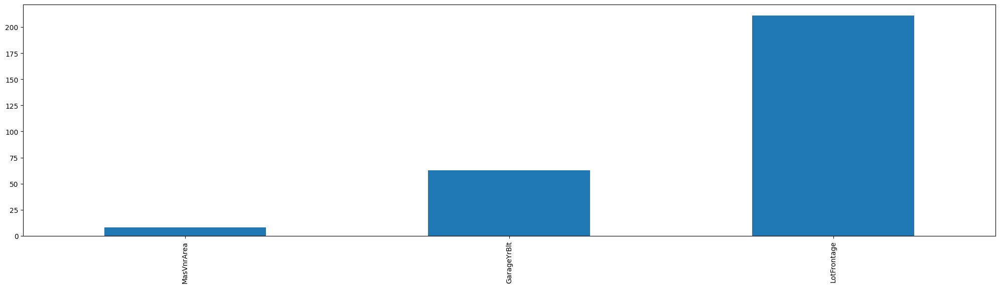

In [8]:
missing = df.isnull().sum()
missing = missing[missing > 0]
missing.sort_values(inplace=True)
missing.plot(kind='bar', figsize=(25, 6));

In [9]:
df["MasVnrArea"].describe()
df["MasVnrArea"].fillna(0, inplace=True)

C:\Users\david\AppData\Local\Temp\ipykernel_15056\101664663.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["MasVnrArea"].fillna(0, inplace=True)


In [10]:
df["LotFrontage"].describe()
df["LotFrontage"].fillna(df["LotFrontage"].min(), inplace=True)

C:\Users\david\AppData\Local\Temp\ipykernel_15056\1414674940.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["LotFrontage"].fillna(df["LotFrontage"].min(), inplace=True)


#### General info

In [11]:
# Quantitative features
quantitative = df.select_dtypes(exclude='object').columns.tolist()
quantitative = quantitative[1:] # exclude Id
quantitative = quantitative[:-1] # exclude SalePrice

# Qualitative features  
qualitative = df.select_dtypes(include='object').columns.tolist()

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1168 entries, 307 to 190
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    1168 non-null   float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          1168 non-null   object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallCond 

In [13]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Id,1168.0,730.418664,422.621839,1.0,364.75,728.5,1094.25,1460.0
MSSubClass,1168.0,56.314212,41.688420,20.0,20.00,50.0,70.00,190.0
LotFrontage,1168.0,61.519692,28.566907,21.0,43.00,63.0,79.00,313.0
LotArea,1168.0,10485.791096,9281.751411,1477.0,7500.00,9485.0,11769.50,215245.0
OverallQual,1168.0,6.093322,1.401073,1.0,5.00,6.0,7.00,10.0
OverallCond,1168.0,5.583904,1.137420,1.0,5.00,5.0,6.00,9.0
YearBuilt,1168.0,1971.005137,30.222454,1875.0,1953.00,1972.0,2000.25,2010.0
YearRemodAdd,1168.0,1984.967466,20.883665,1950.0,1966.00,1994.0,2004.00,2010.0
MasVnrArea,1168.0,102.101027,183.467679,0.0,0.00,0.0,160.00,1600.0
BsmtFinSF1,1168.0,437.226027,435.973974,0.0,0.00,378.5,705.25,2260.0


#### Understanding the columns
Histograms for numerical data and bar plot for categorical data

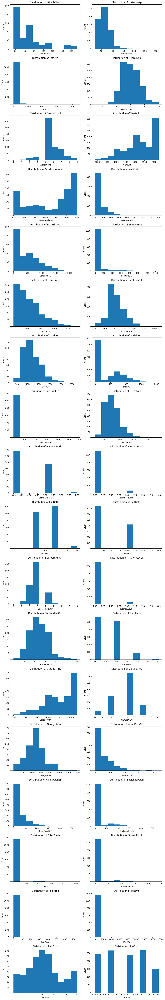

In [14]:
# Define columns to plot (excluding first column)
columns_to_plot = quantitative

# Calculate grid dimensions
n_cols = 2  # Number of columns in the grid
n = len(columns_to_plot)
n_rows = (n + 1) // n_cols  # Number of rows needed

# Create subplots grid with adjusted figure size
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4 * n_rows))
axes = axes.flatten()  # Convert to 1D array for easier handling

# Create plots in grid
for i, col in enumerate(columns_to_plot):
    ax = axes[i]
    if df[col].dtype == 'object':
        # Create bar plot for categorical data
        df[col].value_counts().sort_values(ascending=False).plot(kind='bar', ax=ax)
        ax.set_title(f"Value Counts for {col}")
        ax.set_xlabel('')  # Remove x-axis label
        ax.set_ylabel('')  # Remove y-axis label
    else:
        # Create histogram for numerical data
        df[col].hist(grid=False, ax=ax)
        ax.set_title(f"Distribution of {col}")
        ax.set_xlabel(col)
        ax.set_ylabel("Count")

# Hide any empty subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout and display
plt.tight_layout()
plt.show()

#### Relationship Between Categorical Columns and SalePrice (y)

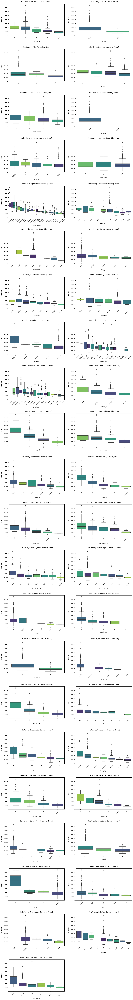

In [15]:
# Define columns to plot (excluding first column)
columns_to_plot = qualitative

# Calculate grid dimensions
n_cols = 2  # Number of columns
n = len(columns_to_plot)
n_rows = (n + 1) // n_cols  # Number of rows needed

# Create subplots grid with adjusted figure size
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()  # Convert to 1D array for easier handling

# Create plots in grid
for i, col in enumerate(columns_to_plot):
    ax = axes[i]
    # Calculate means and sort
    means = df.groupby(col)['SalePrice'].mean().sort_values(ascending=False)
    
    # Create boxplot with sorted categories - FIXED WARNING HERE
    sns.boxplot(
        x=col, 
        y='SalePrice', 
        data=df, 
        order=means.index, 
        hue=col,               # Added to resolve warning
        legend=False,          # Added to resolve warning
        palette='viridis',
        ax=ax
    )
    
    ax.set_title(f"SalePrice by {col} (Sorted by Mean)", pad=12)
    ax.set_xlabel(col, labelpad=10)
    ax.set_ylabel("SalePrice", labelpad=10)
    ax.tick_params(axis='x', rotation=45)
    
    # Improve readability of x-axis labels
    ax.xaxis.set_tick_params(labelsize=9)
    ax.yaxis.set_tick_params(labelsize=9)

# Hide any empty subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout and display
plt.tight_layout(pad=2.0)
plt.show()

#### ANOVA Test

ANOVA (Analysis of Variance) is used to evaluate how strongly each categorical feature (e.g., "Neighborhood", "HouseStyle") influences the target variable, SalePrice.

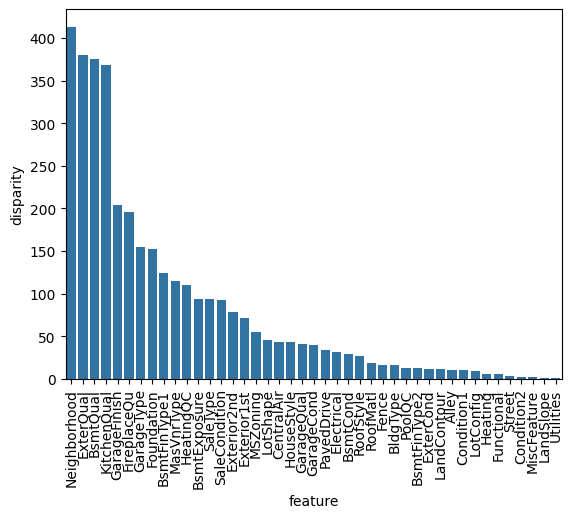

In [16]:


# Create a DataFrame to store the results of the ANOVA test
anv = pd.DataFrame()

# Initialize the DataFrame with a column named 'feature' to store categorical features
anv['feature'] = qualitative

# Initialize an empty list to store the p-values for each feature
pvals = []

# Loop through each categorical feature
for c in qualitative:
    samples = []  # Initialize a list to store the groups of 'SalePrice' for each unique category
    # Loop through each unique category in the current categorical feature
    for cls in df[c].unique():
        # Filter rows where the feature value equals the current category (cls)
        # Extract 'SalePrice' values for this category
        s = df[df[c] == cls]['SalePrice'].values
        samples.append(s)  # Add these values as a group to the samples list
    
    # Perform a one-way ANOVA test on the groups of 'SalePrice' (samples)
    # stats.f_oneway returns the F-statistic and p-value; [1] extracts the p-value
    pval = stats.f_oneway(*samples)[1]
    pvals.append(pval)  # Append the p-value to the list

# Add the calculated p-values to the results DataFrame
anv['pval'] = pvals

# Sort the DataFrame by p-values in ascending order
anv.sort_values('pval', inplace=True)

# Calculate the disparity for visualization: log(1/pval) magnifies significance
anv['disparity'] = np.log(1./anv['pval'].values)

# Create a bar plot using seaborn to visualize feature disparity
sns.barplot(data=anv, x='feature', y='disparity')

# Rotate the x-axis labels by 90 degrees for better readability
x = plt.xticks(rotation=90)


#### Correlations

##### Encode
It’s useful to encode categorical features into numerical representations. The function encode is designed to create an ordinal encoding for a given categorical feature based on the mean Sale Price (SalePrice) of each category. This ensures the encoding reflects the relationship between the feature and the target variable.

In [17]:
def encode(frame, feature):
    ordering = pd.DataFrame()
    ordering['val'] = frame[feature].unique()
    ordering.index = ordering.val
    ordering['spmean'] = frame[[feature, 'SalePrice']].groupby(feature).mean()['SalePrice']
    ordering = ordering.sort_values('spmean')
    ordering['ordering'] = range(1, ordering.shape[0] + 1)
    ordering = ordering['ordering'].to_dict()
    
    for cat, o in ordering.items():
        frame.loc[frame[feature] == cat, feature + '_E'] = o
    
qual_encoded = []
for q in qualitative:  
    encode(df, q)
    qual_encoded.append(q + '_E')

print(qual_encoded)

['MSZoning_E', 'Street_E', 'Alley_E', 'LotShape_E', 'LandContour_E', 'Utilities_E', 'LotConfig_E', 'LandSlope_E', 'Neighborhood_E', 'Condition1_E', 'Condition2_E', 'BldgType_E', 'HouseStyle_E', 'RoofStyle_E', 'RoofMatl_E', 'Exterior1st_E', 'Exterior2nd_E', 'MasVnrType_E', 'ExterQual_E', 'ExterCond_E', 'Foundation_E', 'BsmtQual_E', 'BsmtCond_E', 'BsmtExposure_E', 'BsmtFinType1_E', 'BsmtFinType2_E', 'Heating_E', 'HeatingQC_E', 'CentralAir_E', 'Electrical_E', 'KitchenQual_E', 'Functional_E', 'FireplaceQu_E', 'GarageType_E', 'GarageFinish_E', 'GarageQual_E', 'GarageCond_E', 'PavedDrive_E', 'PoolQC_E', 'Fence_E', 'MiscFeature_E', 'SaleType_E', 'SaleCondition_E']


In [18]:
df[['Neighborhood', 'Neighborhood_E']].head()

,Neighborhood,Neighborhood_E
307,IDOTRR,1.0
1341,SawyerW,13.0
1175,NoRidge,25.0
349,NridgHt,24.0
621,NWAmes,15.0


The next code computes the Spearman correlation between each feature and SalePrice and visualizes the results using a horizontal bar plot.

##### Why Spearman Correlation?
Spearman correlation is used in this analysis because:

* Handles Monotonic Relationships: Unlike Pearson correlation, which measures linear relationships, Spearman correlation captures monotonic relationships. This makes it more robust for features that might have a non-linear but consistent ranking association with SalePrice.
* Works with Ordinal Data: Some features, especially the encoded categorical variables (qual_encoded), are ordinal in nature. Spearman correlation is well-suited for such data since it is based on rank-order rather than raw values.
* Less Sensitive to Outliers: By relying on ranks, Spearman correlation is less affected by extreme values or outliers, which are common in real-world datasets like house prices.

<Axes: xlabel='spearman', ylabel='feature'>

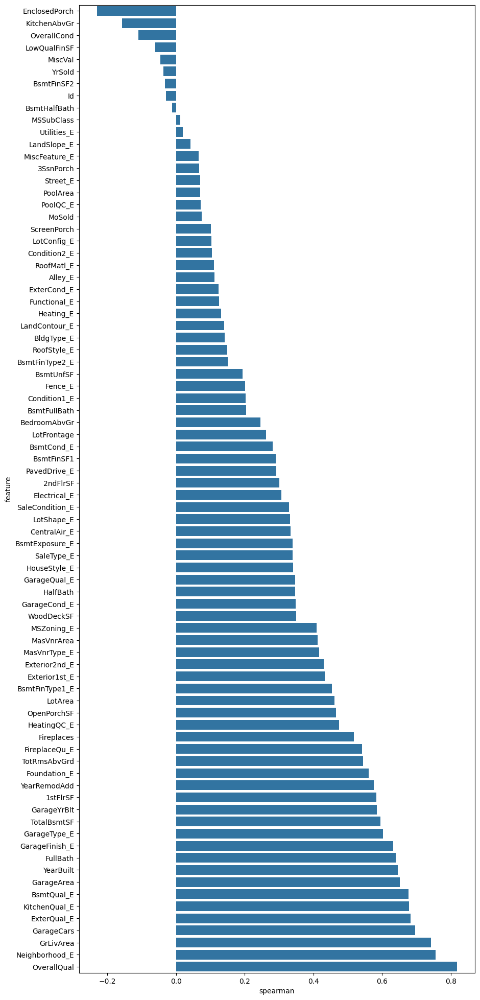

In [19]:
spr = pd.DataFrame()
features = df.select_dtypes(exclude='object').columns.tolist() + qual_encoded
features = [feature for feature in features if feature != 'SalePrice']
spr['feature'] = features
spr['spearman'] = [df[f].corr(df['SalePrice'], 'spearman') for f in features]
spr = spr.sort_values('spearman')
plt.figure(figsize=(10, 0.20*len(features)))
sns.barplot(data=spr, y='feature', x='spearman', orient='h')

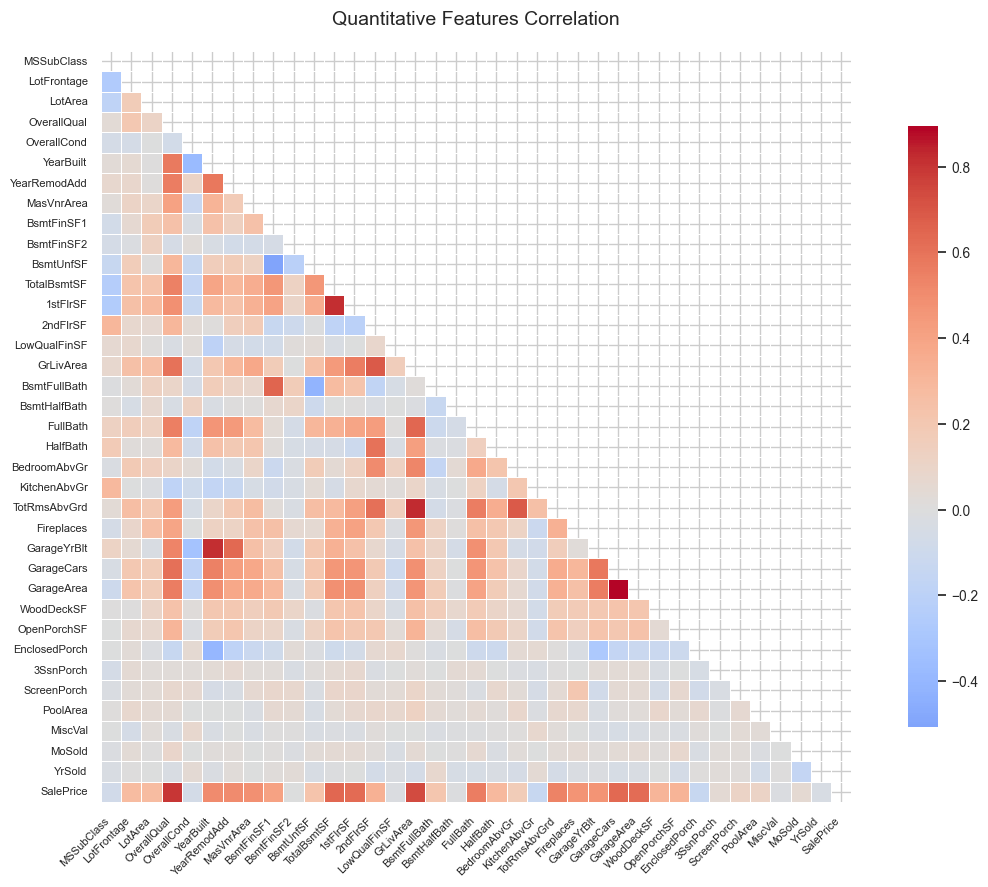

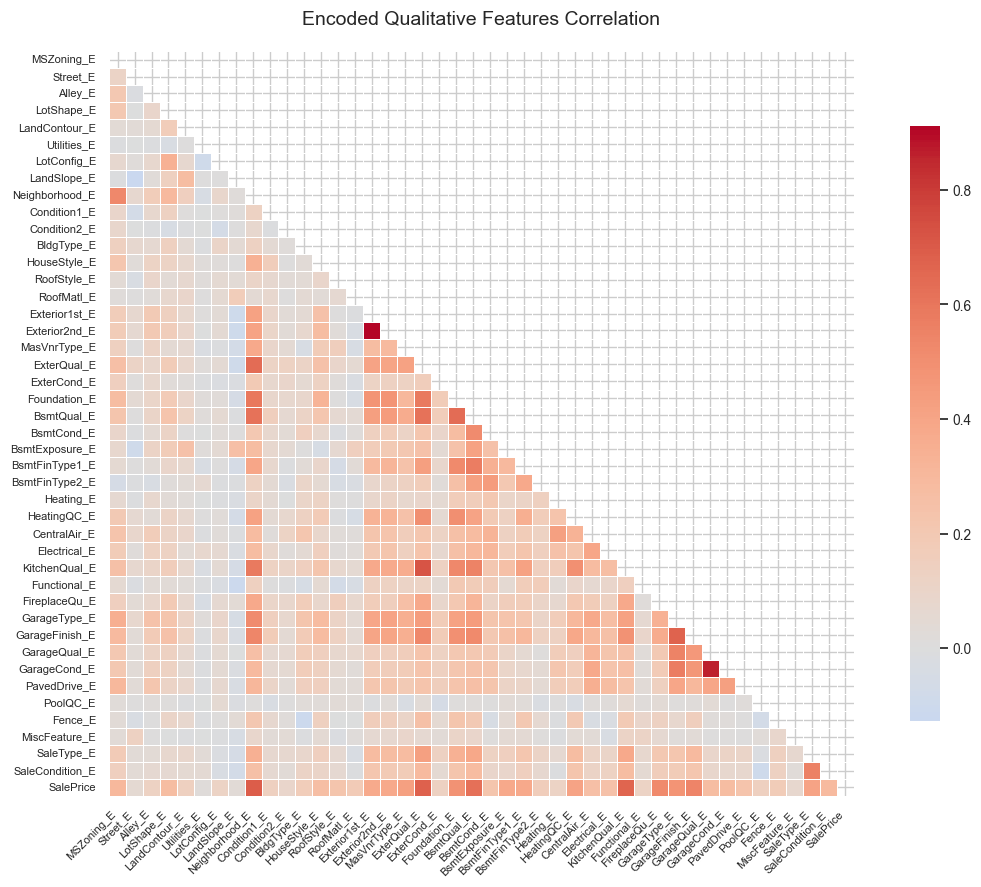

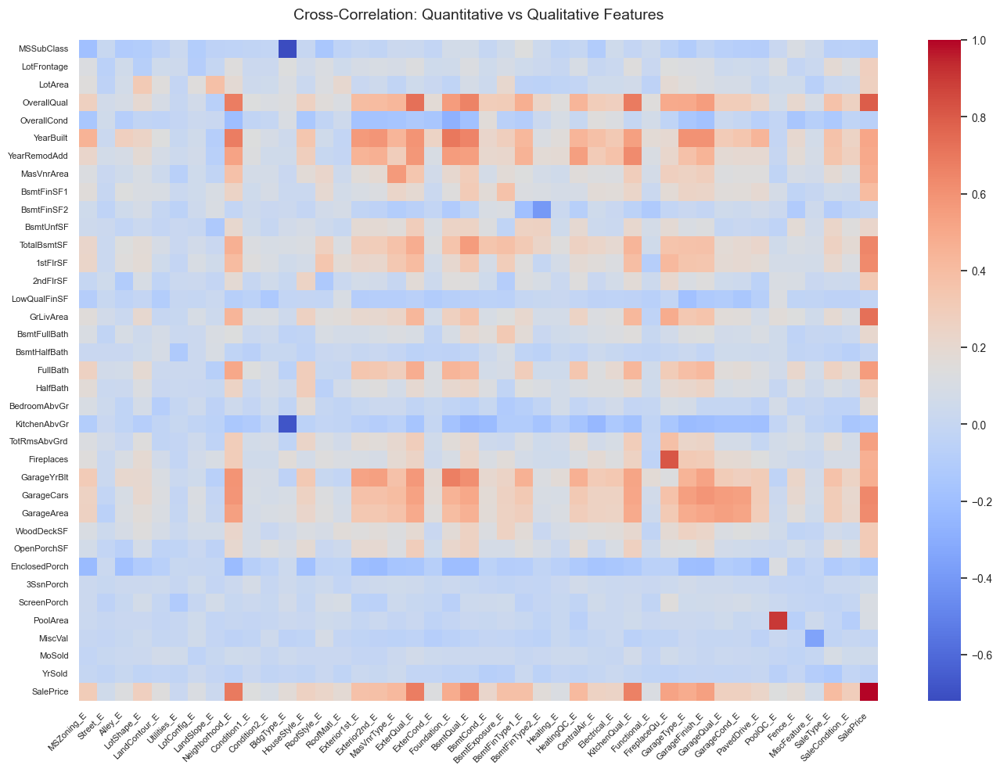

In [20]:
# Set style for better aesthetics
sns.set_theme(context="notebook", style="whitegrid", font_scale=0.9)

# Define helper function to plot heatmaps
def plot_corr_heatmap(data, columns, title, figsize=(12, 9)):
    plt.figure(figsize=figsize)
    corr = data[columns].corr()
    mask = None
    # Optional: Mask upper triangle for square matrices
    if len(columns) == len(corr.columns):
        mask = np.triu(np.ones_like(corr, dtype=bool))
    sns.heatmap(
        corr,
        cmap='coolwarm',
        annot=False,  # Set to True if you want values
        fmt=".2f",
        center=0,
        square=True,
        mask=mask,
        cbar_kws={'shrink': 0.8},
        linewidths=0.5
    )
    plt.title(title, fontsize=14, pad=20)
    plt.xticks(rotation=45, ha='right', fontsize=8)
    plt.yticks(rotation=0, fontsize=8)
    plt.tight_layout()

# Plot quantitative features + SalePrice
plot_corr_heatmap(
    df,
    quantitative + ['SalePrice'],
    "Quantitative Features Correlation"
)

# Plot encoded qualitative features + SalePrice
plot_corr_heatmap(
    df,
    qual_encoded + ['SalePrice'],
    "Encoded Qualitative Features Correlation"
)

# Cross-correlation between quantitative and qualitative features
plt.figure(figsize=(14, 10))
corr = pd.DataFrame(np.zeros([len(quantitative)+1, len(qual_encoded)+1]), index=quantitative+['SalePrice'], columns=qual_encoded+['SalePrice'])
for q1 in quantitative+['SalePrice']:
    for q2 in qual_encoded+['SalePrice']:
        corr.loc[q1, q2] = df[q1].corr(df[q2])
sns.heatmap( 
    corr,
    cmap='coolwarm',
)
plt.title("Cross-Correlation: Quantitative vs Qualitative Features", fontsize=14, pad=20)
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.yticks(rotation=0, fontsize=8)
plt.tight_layout()

plt.show()

##### Variance Inflation Factor (VIF)

Variance Inflation Factor (VIF) is a measure used to detect multicollinearity in a dataset, particularly among the independent (predictor) variables. Multicollinearity occurs when two or more predictors are highly correlated, meaning they provide redundant or overlapping information.

In simple terms, VIF quantifies how much the variance of a feature’s coefficient in a regression model is inflated due to multicollinearity with other features.

In [21]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for numerical features
columns = quantitative + qual_encoded
columns = [feature for feature in columns if feature not in ['GarageYrBlt', "SalePrice"]] # Exclude GarageYrBlt by 
X = df[columns]
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]

print(vif_data)


c:\Users\david\Documents\Courses\MachineLearningPortfolio\.venv\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


            feature         VIF
0        MSSubClass   13.886808
1       LotFrontage    7.976878
2           LotArea    3.724178
3       OverallQual   86.488743
4       OverallCond   54.591730
..              ...         ...
73         PoolQC_E  281.049683
74          Fence_E   35.660154
75    MiscFeature_E  145.278401
76       SaleType_E   37.729146
77  SaleCondition_E  122.178071

[78 rows x 2 columns]


In [22]:
# Sort VIF data for better visualization
vif_data = vif_data.sort_values(by="VIF", ascending=False)


In [23]:
vif_data.head(100)

,feature,VIF
13,2ndFlrSF,inf
12,1stFlrSF,inf
10,BsmtUnfSF,inf
11,TotalBsmtSF,inf
8,BsmtFinSF1,inf
...,...,...
28,EnclosedPorch,1.594870
17,BsmtHalfBath,1.321138
30,ScreenPorch,1.274758
32,MiscVal,1.243612


C:\Users\david\AppData\Local\Temp\ipykernel_15056\87166190.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=vif_data[vif_data["VIF"] <1000], x="VIF", y="feature", palette="viridis")


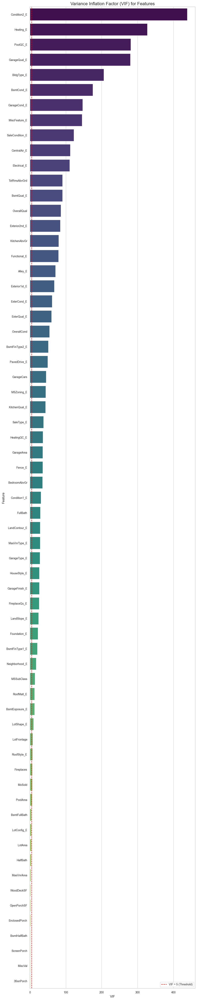

In [24]:
# Plot VIF values
plt.figure(figsize=(10, 50))
sns.barplot(data=vif_data[vif_data["VIF"] <1000], x="VIF", y="feature", palette="viridis")
plt.title("Variance Inflation Factor (VIF) for Features", fontsize=16)
plt.xlabel("VIF", fontsize=12)
plt.ylabel("Feature", fontsize=12)
plt.axvline(x=5, color='red', linestyle='--', label="VIF = 5 (Threshold)")
plt.legend()
plt.tight_layout()
plt.show()

#### Pairplots
Sale price compares to each independent variable

In [25]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,GarageType_E,GarageFinish_E,GarageQual_E,GarageCond_E,PavedDrive_E,PoolQC_E,Fence_E,MiscFeature_E,SaleType_E,SaleCondition_E
307,308,50,RM,21.0,7920,Pave,Grvl,IR1,Lvl,AllPub,...,1.0,1.0,2.0,2.0,1.0,1.0,3.0,4.0,5.0,5.0
1341,1342,20,RL,66.0,13695,Pave,MISSING,Reg,Lvl,AllPub,...,3.0,2.0,4.0,6.0,3.0,1.0,5.0,4.0,5.0,5.0
1175,1176,50,RL,85.0,10678,Pave,MISSING,Reg,Lvl,AllPub,...,6.0,4.0,4.0,6.0,3.0,1.0,5.0,4.0,5.0,5.0
349,350,60,RL,56.0,20431,Pave,MISSING,IR2,Lvl,AllPub,...,6.0,4.0,4.0,6.0,3.0,1.0,5.0,4.0,9.0,6.0
621,622,60,RL,90.0,10800,Pave,MISSING,Reg,Lvl,AllPub,...,6.0,3.0,4.0,6.0,3.0,1.0,5.0,4.0,5.0,5.0


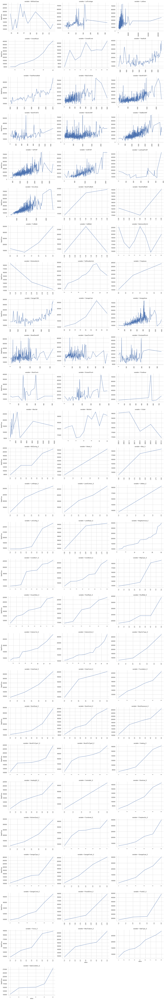

In [26]:
def pairplot(x, y, **kwargs):
    ax = plt.gca()
    ts = pd.DataFrame({'time': x, 'val': y})
    ts = ts.groupby('time').mean()
    ts.plot(ax=ax)
    plt.xticks(rotation=90)
    
f = pd.melt(df, id_vars=['SalePrice'], value_vars=quantitative+qual_encoded)
g = sns.FacetGrid(f, col="variable", col_wrap=3, sharex=False, sharey=False, height=4, aspect=1.5)  # Increase col_wrap for a wider layout
g = g.map(pairplot, "value", "SalePrice")

#### Distribution Fitting and Linearity Evaluation
The idea aim to both understand the underlying distributions of the features and evaluate how different transformations impact the relationship between these features and the target variable (SalePrice). This is critical for ensuring that the data is well-prepared for linear modeling.

c:\Users\david\Documents\Courses\MachineLearningPortfolio\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:6626: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
c:\Users\david\Documents\Courses\MachineLearningPortfolio\.venv\Lib\site-packages\numpy\_core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
c:\Users\david\Documents\Courses\MachineLearningPortfolio\.venv\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2036: RuntimeWarning: overflow encountered in divide
  place(output, cond, self._pdf(*goodargs) / scale)
c:\Users\david\Documents\Courses\MachineLearningPortfolio\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:6626: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
c:\Users\david\Documents\Courses\MachineLearningPortfolio\.venv\Lib\site-packages\numpy\_core\f

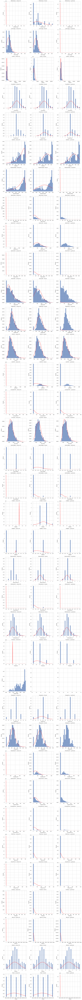

In [27]:
# Set the figure size
fig, axes = plt.subplots(nrows=len(quantitative), ncols=3, figsize=(15, 5 * len(quantitative)))

# Loop through features and plot each distribution in three columns
for i, feature in enumerate(quantitative):
    try:
        # Johnson SU
        sns.histplot(df[feature], kde=False, stat="density", bins=30, ax=axes[i, 0])
        x = np.linspace(df[feature].min(), df[feature].max(), 100)
        axes[i, 0].plot(x, stats.johnsonsu.pdf(x, *stats.johnsonsu.fit(df[feature])), color="red")
        axes[i, 0].set_title(f"{feature} - Johnson SU")

        # Normal Distribution
        sns.histplot(df[feature], kde=False, stat="density", bins=30, ax=axes[i, 1])
        x = np.linspace(df[feature].min(), df[feature].max(), 100)
        axes[i, 1].plot(x, stats.norm.pdf(x, *stats.norm.fit(df[feature])), color="red")
        axes[i, 1].set_title(f"{feature} - Normal")

        # Log-Normal Distribution
        sns.histplot(df[feature], kde=False, stat="density", bins=30, ax=axes[i, 2])
        x = np.linspace(df[feature].min(), df[feature].max(), 100)
        axes[i, 2].plot(x, stats.lognorm.pdf(x, *stats.lognorm.fit(df[feature])), color="red")
        axes[i, 2].set_title(f"{feature} - Log Normal")

    except:
        pass

# Adjust layout for better visualization
plt.tight_layout()
plt.show()

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats

# ---------------------------------------------------
# 1. Define candidate distributions with constraints
# ---------------------------------------------------
DISTRIBUTIONS = [
    {
        "dist": stats.norm,
        "name": "Normal",
        "constraint": lambda data: True  # Always applicable
    },
    {
        "dist": stats.johnsonsu,
        "name": "Johnson SU",
        "constraint": lambda data: True
    },
    {
        "dist": stats.lognorm,
        "name": "Log-Normal",
        "constraint": lambda data: (data > 0).all()
    },
    {
        "dist": stats.expon,
        "name": "Exponential",
        "constraint": lambda data: (data >= 0).all()
    },
    {
        "dist": stats.weibull_min,
        "name": "Weibull",
        "constraint": lambda data: (data > 0).all()
    },
    # You can add more distributions if needed.
]

def best_fitting_distribution(data):
    """
    Fit each candidate distribution to data and return the one with the lowest AIC.
    If none fit, fallback to a Normal distribution.
    """
    best_dist = None
    best_aic = np.inf

    for candidate in DISTRIBUTIONS:
        if not candidate["constraint"](data):
            continue
        try:
            params = candidate["dist"].fit(data)
            log_likelihood = np.sum(candidate["dist"].logpdf(data, *params))
            k = len(params)
            aic = 2 * k - 2 * log_likelihood
            if aic < best_aic:
                best_aic = aic
                best_dist = {**candidate, "params": params}
        except Exception:
            continue

    if best_dist is None:
        best_dist = {
            "dist": stats.norm,
            "name": "Normal",
            "params": stats.norm.fit(data)
        }
    return best_dist

# ---------------------------------------------------
# 2. Transform each feature using its best-fitting distribution
# ---------------------------------------------------
# Assume 'quantitative' and 'qual_encoded' are your lists of feature names.
transformation_dict = {}  # Record which transformation is used for each feature

# Save best dist in a dictionary
best_distribution_dict = {}

for feature in quantitative + qual_encoded:
    data = df[feature].dropna()
    best_fit = best_fitting_distribution(data)
    transformation_dict[feature] = best_fit["name"]
    # Create a new column for the transformed feature using the fitted CDF.
    df[f"{feature}_transformed"] = best_fit["dist"].cdf(df[feature], *best_fit["params"])

    # Save best dist in a dictionary
    best_distribution_dict[feature] = best_fit["dist"]

# ---------------------------------------------------
# 3. Also transform SalePrice using its best-fitting distribution
# ---------------------------------------------------
saleprice_data = df['SalePrice'].dropna()
best_fit_saleprice = best_fitting_distribution(saleprice_data)
saleprice_transformation = best_fit_saleprice["name"]
df["SalePrice_transformed"] = best_fit_saleprice["dist"].cdf(df["SalePrice"], *best_fit_saleprice["params"])

# ---------------------------------------------------
# 4. Create a grid of subplots: one row per feature, four columns:
#     Column 1: Raw feature vs. Raw SalePrice
#     Column 2: Transformed feature vs. Raw SalePrice
#     Column 3: Transformed feature vs. Transformed SalePrice
#     Column 4: Raw feature vs. Transformed SalePrice
# ---------------------------------------------------
n_features = len(quantitative + qual_encoded)
fig, axes = plt.subplots(n_features, 4, figsize=(24, 4 * n_features), squeeze=False)

for i, feature in enumerate(quantitative + qual_encoded):
    # ----------------------------
    # Column 1: Raw Feature vs. Raw SalePrice
    # ----------------------------
    ax1 = axes[i, 0]
    data_raw = df[[feature, 'SalePrice']].dropna()
    # Group by the raw feature values and compute the mean SalePrice
    temp_raw = data_raw.groupby(feature)['SalePrice'].mean().reset_index()
    ax1.plot(temp_raw[feature], temp_raw['SalePrice'], marker='o', linestyle='-')
    ax1.set_title(f"{feature} (Raw) vs. SalePrice (Raw)")
    ax1.set_xlabel(feature)
    ax1.set_ylabel("SalePrice (Raw)")
    
    # ----------------------------
    # Column 2: Transformed Feature vs. Raw SalePrice
    # ----------------------------
    ax2 = axes[i, 1]
    trans_feature = f"{feature}_transformed"
    data_trans_feature = df[[trans_feature, 'SalePrice']].dropna()
    temp_trans_feature = data_trans_feature.groupby(trans_feature)['SalePrice'].mean().reset_index()
    ax2.plot(temp_trans_feature[trans_feature], temp_trans_feature['SalePrice'], marker='o', linestyle='-')
    ax2.set_title(f"{feature} (Transformed: {transformation_dict[feature]}) vs. SalePrice (Raw)")
    ax2.set_xlabel("Transformed Value")
    ax2.set_ylabel("SalePrice (Raw)")
    
    # ----------------------------
    # Column 3: Transformed Feature vs. Transformed SalePrice
    # ----------------------------
    ax3 = axes[i, 2]
    data_trans_both = df[[trans_feature, 'SalePrice_transformed']].dropna()
    temp_trans_both = data_trans_both.groupby(trans_feature)['SalePrice_transformed'].mean().reset_index()
    ax3.plot(temp_trans_both[trans_feature], temp_trans_both['SalePrice_transformed'], marker='o', linestyle='-')
    ax3.set_title(f"{feature} (Transformed: {transformation_dict[feature]}) vs. SalePrice (Transformed: {saleprice_transformation})")
    ax3.set_xlabel("Transformed Value")
    ax3.set_ylabel("SalePrice (Transformed)")
    
    # ----------------------------
    # Column 4: Raw Feature vs. Transformed SalePrice
    # ----------------------------
    ax4 = axes[i, 3]
    data_raw_transSP = df[[feature, 'SalePrice_transformed']].dropna()
    temp_raw_transSP = data_raw_transSP.groupby(feature)['SalePrice_transformed'].mean().reset_index()
    ax4.plot(temp_raw_transSP[feature], temp_raw_transSP['SalePrice_transformed'], marker='o', linestyle='-')
    ax4.set_title(f"{feature} (Raw) vs. SalePrice (Transformed: {saleprice_transformation})")
    ax4.set_xlabel(feature)
    ax4.set_ylabel("SalePrice (Transformed)")

plt.tight_layout()
plt.show()


C:\Users\david\AppData\Local\Temp\ipykernel_15056\2185698452.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{feature}_transformed"] = best_fit["dist"].cdf(df[feature], *best_fit["params"])
C:\Users\david\AppData\Local\Temp\ipykernel_15056\2185698452.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{feature}_transformed"] = best_fit["dist"].cdf(df[feature], *best_fit["params"])
C:\Users\david\AppData\Local\Temp\ipykernel_15056\2185698452.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usual

---
### **4. Prepare the data for machine learning algorithms.**

In [29]:

df = pd.read_csv("../data/house_price_project/train.csv")

df, df_test = split_train_test(df)

# Define X and y for training
X_train = df.drop(columns=['SalePrice'])  # Features
y_train = df['SalePrice']  # Target variable

# Define X_test 
X_test = df_test.drop(columns=['SalePrice'])
y_test = df_test['SalePrice']



#### Transform X features

In [ ]:
import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer, StandardScaler
from sklearn.impute import SimpleImputer

def delete_id(X):
    X = X.copy()
    return X.drop("Id", axis=1)


def replace_missing_values(X):
    X = X.copy()
    for col in X.columns:
        if X[col].dtype == 'object':
            X[col] = X[col].fillna("MISSING")

    X["MasVnrArea"].fillna(0, inplace=True)
    X["LotFrontage"].fillna(21, inplace=True) # Min LotFrontage
    return X


def delete_features(X):
    X = X.copy()
    # delete garagecars & garageyrblt by extreme correlation with another values
    return X.drop(["GarageCars", "GarageYrBlt"], axis=1)

In [68]:
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd

class TargetEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, drop_original=True):
        self.drop_original = drop_original
        self.mapping_ = {}  # to store mapping for each feature
        self.features = None

    def fit(self, X, y):
        # Define features based on object dtype columns in X
        self.features = X.select_dtypes(include='object').columns.tolist()
        for feature in self.features:
            df_temp = pd.DataFrame({feature: X[feature], 'SalePrice': y})
            ordering = df_temp.groupby(feature)['SalePrice'].mean().sort_values()
            mapping = {cat: rank for rank, cat in enumerate(ordering.index, start=1)}
            self.mapping_[feature] = mapping
        return self

    def transform(self, X):
        X = X.copy()
        for feature in self.features:
            X[feature + '_E'] = X[feature].map(self.mapping_.get(feature))
            # Optionally handle unseen categories
            X[feature + '_E'].fillna(0, inplace=True)
            if self.drop_original:
                X.drop(columns=[feature], inplace=True)
        return X

In [32]:
best_distribution_dict

{'MSSubClass': <scipy.stats._continuous_distns.lognorm_gen at 0x1c529b92150>,
 'LotFrontage': <scipy.stats._continuous_distns.lognorm_gen at 0x1c529b92150>,
 'LotArea': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1c529b7e910>,
 'OverallQual': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1c529b7e910>,
 'OverallCond': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1c529b7e910>,
 'YearBuilt': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1c529b7e910>,
 'YearRemodAdd': <scipy.stats._continuous_distns.lognorm_gen at 0x1c529b92150>,
 'MasVnrArea': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1c529b7e910>,
 'BsmtFinSF1': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1c529b7e910>,
 'BsmtFinSF2': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1c529b7e910>,
 'BsmtUnfSF': <scipy.stats._continuous_distns.expon_gen at 0x1c529b33e50>,
 'TotalBsmtSF': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1c529b7e910>,
 '1stFlrSF': <scipy.stats._continuous_distns.logn

In [33]:
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd

class FeaturesTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, features_to_transform: dict):
        self.features_to_transform = features_to_transform
        self.mapping_ = {}

    def fit(self, X, y=None):
        for feature, distribution in self.features_to_transform.items():
            params = distribution.fit(X[feature].dropna())  # Ensure we fit only on non-null values
            self.mapping_[feature] = params  # Save fitted parameters
        return self

    def transform(self, X):
        X = X.copy()
        for feature, distribution in self.features_to_transform.items():
            if feature in self.mapping_:
                params = self.mapping_[feature]
                # Ensure NaN values are preserved
                X[feature] = X[feature].apply(lambda x: distribution.cdf(x, *params) if pd.notna(x) else 0) # Cero based on EDA 
        return X



In [80]:

features_to_transform = [
    "OverallQual", "BsmtFinSF2", "TotalBsmtSF", "1stFlrSF",
    "LowQualFinSF", "GrLivArea", "BsmtFullBath", "BsmtHalfBath",
    "FullBath", "HalfBath", "TotRmsAbvGrd",
    "GarageArea", "3SsnPorch", "ScreenPorch", "PoolArea", "MiscVal",
    "MoSold"
    ]

features_to_transform_distributions = {}
for feature in features_to_transform:
    features_to_transform_distributions[feature] = best_distribution_dict[feature]

In [75]:
features_to_transform_distributions

{'OverallQual': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1c529b7e910>,
 'BsmtFinSF2': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1c529b7e910>,
 'TotalBsmtSF': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1c529b7e910>,
 '1stFlrSF': <scipy.stats._continuous_distns.lognorm_gen at 0x1c529b92150>,
 'LowQualFinSF': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1c529b7e910>,
 'GrLivArea': <scipy.stats._continuous_distns.lognorm_gen at 0x1c529b92150>,
 'BsmtFullBath': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1c529b7e910>,
 'BsmtHalfBath': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1c529b7e910>,
 'FullBath': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1c529b7e910>,
 'HalfBath': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1c529b7e910>,
 'TotRmsAbvGrd': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1c529b7e910>,
 'GarageCars': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1c529b7e910>,
 'GarageArea': <scipy.stats._continuous_d

In [81]:

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import RobustScaler
import pandas as pd

class FeaturesRobustScaler(BaseEstimator, TransformerMixin):
    def __init__(self):
        """
        Custom transformer for robust feature scaling (handling outliers).
        :param features_to_scale: List of feature names to be scaled
        """
        self.scalers_ = {}

    def fit(self, X, y=None):
        """
        Fits a RobustScaler to each feature separately.
        """
        X = X.copy()
  
        
        for feature in X.columns:
            scaler = RobustScaler()
            scaler.fit(X[[feature]])  # Fit only on training data
            self.scalers_[feature] = scaler  # Store scaler for each feature
        
        return self

    def transform(self, X):
        """
        Applies the fitted RobustScaler to the dataset.
        """
        X = X.copy()
        for feature, scaler in self.scalers_.items():
            X[feature] = scaler.transform(X[[feature]])  # Apply scaling

        return X

In [90]:


# Pipeline Definition
feature_pipeline  = Pipeline([
    ("delete_id", FunctionTransformer(delete_id)),
    ('replace_missing_values', FunctionTransformer(replace_missing_values)),
    ("delete_features", FunctionTransformer(delete_features)),
    ("target_encoder", TargetEncoder(drop_original=True)),
    ("features_transformer", FeaturesTransformer(features_to_transform=features_to_transform_distributions)),
    ("features_robust_scaler", FeaturesRobustScaler()),
])


#### Transform Y features

In [93]:
class JohnsonSUTransformer:
    def __init__(self):
        self.shape1_ = None  # a (gamma) parameter
        self.shape2_ = None  # b (delta) parameter
        self.loc_ = None    # loc (epsilon)
        self.scale_ = None  # scale (lambda)

    def fit(self, y):
        """Fit Johnson SU distribution to `y` and store parameters."""
        # Ensure no NaN in y (critical for fitting)
        if np.isnan(y).any():
            raise ValueError("Input `y` contains NaN values. Handle them first.")
        self.shape1_, self.shape2_, self.loc_, self.scale_ = stats.johnsonsu.fit(y)
        return self

    def transform(self, y):
        """Transform `y` to follow a standard normal distribution."""
        z = (y - self.loc_) / self.scale_
        return self.shape1_ + self.shape2_ * np.arcsinh(z)  # Z ~ N(0,1)

    def inverse_transform(self, y_transformed):
        """Invert the transformation to get back original `y`."""
        z = (y_transformed - self.shape1_) / self.shape2_
        return self.loc_ + self.scale_ * np.sinh(z)


    
# Initialize Johnson SU transformer
johnson_su = JohnsonSUTransformer()
# Fit the transformer on `y_train`
johnson_su.fit(y_train)


### 5. Select a model and train it

In [ ]:
# TODO test differnet models
# check bayesian ridge regression

In [94]:
from sklearn.compose import TransformedTargetRegressor
from sklearn.linear_model import LinearRegression

# Define model with transformed target
model_1 = TransformedTargetRegressor(
    regressor=LinearRegression(),  # TODO define model
    func=johnson_su.transform,  # Use stored params for forward transform
    inverse_func=johnson_su.inverse_transform,  # Use stored params for inverse transform

)

#### Prediction

In [ ]:

# Define the full pipeline
full_pipeline = Pipeline([
    ("features", feature_pipeline),  # Transforms X
    ("model", model_1)  # Transforms y, fits model, and applies inverse transformation
])

# Train the pipeline
full_pipeline.fit(X_train, y_train)  # y_train is transformed before training

# Make predictions (automatically applies inverse transformation)
y_pred = full_pipeline.predict(X_test)  # y_pred is returned in the original scale

C:\Users\david\AppData\Local\Temp\ipykernel_15056\2749784583.py:18: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X["MasVnrArea"].fillna(0, inplace=True)
C:\Users\david\AppData\Local\Temp\ipykernel_15056\2749784583.py:19: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, w

GarageYrBlt     63
MSZoning         0
MSSubClass       0
LotArea          0
Street           0
Alley            0
LotFrontage      0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
LotShape         0
BldgType         0
HouseStyle       0
OverallCond      0
OverallQual      0
YearRemodAdd     0
dtype: int64
GarageYrBlt     63
MSZoning         0
MSSubClass       0
LotArea          0
Street           0
Alley            0
LotFrontage      0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
LotShape         0
BldgType         0
HouseStyle       0
OverallCond      0
OverallQual      0
YearRemodAdd     0
dtype: int64


C:\Users\david\AppData\Local\Temp\ipykernel_15056\629027553.py:25: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[feature + '_E'].fillna(0, inplace=True)
C:\Users\david\AppData\Local\Temp\ipykernel_15056\629027553.py:25: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, w

GarageYrBlt     18
MSZoning         0
MSSubClass       0
LotArea          0
Street           0
Alley            0
LotFrontage      0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
LotShape         0
BldgType         0
HouseStyle       0
OverallCond      0
OverallQual      0
YearRemodAdd     0
dtype: int64
GarageYrBlt     18
MSZoning         0
MSSubClass       0
LotArea          0
Street           0
Alley            0
LotFrontage      0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
LotShape         0
BldgType         0
HouseStyle       0
OverallCond      0
OverallQual      0
YearRemodAdd     0
dtype: int64


###### Measure

In [98]:
from sklearn.metrics import root_mean_squared_error
rmse = root_mean_squared_error(y_test, y_pred)
print("RMSE:", rmse)

RMSE: 46601.68463429315


In [101]:
df_results = pd.DataFrame({
    "y_test": y_test,
    "y_pred": y_pred
})

In [107]:
df_results.sort_values("y_test", ascending=False).head(10)

,y_test,y_pred
769,538000,548596.631352
608,359100,249503.782425
877,350000,351836.972398
718,341000,338655.598555
480,326000,356732.027727
167,325624,364526.306779
1105,325000,374159.931766
326,324000,286589.610254
724,320000,260322.249444
1036,315500,308383.837910
